# First assessment of the algorithm

In [1]:
using Revise
using Pkg
Pkg.activate("../mpr_atbd_env_jl")
#Pkg.develop(path="../algorithm/OEM")
includet("../algorithm/src/OEM_with_SIT.jl")
includet("../algorithm/src/IOutils.jl")
using .OEM
#Pkg.activate("/Users/huntemann/from_janna/")

  Activating project at `~/MultiParameter_ATBD/mpr_atbd_env_jl`


In [2]:
using CSV
using DataFrames
using HDF5
using Dates
using Statistics
using StaticArrays
using ForwardDiff
using LinearAlgebra
#using Inversion
#using PyCall

#using ProgressMeter
#@pyimport cartopy.crs as ccrs

In [3]:
using PythonCall
mpl=pyimport("matplotlib")
mpl.use("agg")
plt=pyimport("matplotlib.pyplot")
ccrs=pyimport("cartopy.crs")
pr=pyimport("pyresample")
llur=getindex.(Ref(nsidcg.area_extent),[0,2,1,3])
cfeature=pyimport("cartopy.feature")
mycrs=nsidcg.to_cartopy_crs();

In [4]:
D=Date(2021,11,10)
if filesize("../data/oem_input.h5")>0
    outg = h5read("../data/oem_input.h5","/TBS_14") |> x->[x[:,:,i] for i in 1:size(x,3)]
    wsp,twv,clw,t2m,tsk=h5read("../data/oem_input.h5","/era5") |> x->[x[:,:,i] for i in 1:size(x,3)]
else
    wsp,twv,clw,t2m,tsk=get_ecmwf_on_NSIDC(D) 
    outg=prepare_oem_tbs(D);
    h5write("../data/oem_input.h5","/TBS_14",cat(outg...,dims=3))
    h5write("../data/oem_input.h5","/era5",cat(wsp,twv,clw,t2m,tsk,dims=3))
end

5-element Vector{Matrix{Float64}}:
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]
 [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0]

In [8]:
get_Sg(ii)=[wsp[ii] twv[ii] clw[ii] tsk[ii] t2m[ii] 0.5 0.5 100]



function run_oem(outg,wsp,twv,clw,t2m,tsk,D;
        routine=:old
    )
    dat=[fill(NaN,size(wsp)) for i=1:8]
    err=[fill(NaN,size(wsp)) for i=1:8]
    res=[fill(NaN,size(wsp)) for i=1:14]

    S_e = Diagonal([ 5.0,   5.0,    #1.4v,h
                2.356, 4.832,  #6.9v,h
                1.609, 5.460,  #10.6v,h
                0.977, 4.932,  #18.7v,h
                200+1.042,200+ 2.661,  #23.8v,h
                2.540, 2.65, # 36.5v,h
                204.903, 206.274]) #89v,h

    S_p = Diagonal([24.6048, #wsp
                    22.0962, #twv
                    #0.0204, #clw
                    0.1, #clw
                    10.8936, #sst
                    10.9468, #ist
                    0.1, #ic #good guess when initial value from TBs
                    0.1, #myif # good guess when initial value from TBs
                    200.0]) #sit [cm]
    
    for ii in eachindex(wsp)
        if (isnan(outg[1][ii]) | isnan(outg[3][ii]) | (t2m[ii]==0))
            continue
        end

        TBs=[outg[i][ii] for i =1:14]
        #without using the TBs
        Sg=[wsp[ii],twv[ii],clw[ii],tsk[ii],t2m[ii],0.5,0.5,100]
        #including the TBs for guessing
        Sg=calc_pa(TBs,Sg)

 
        if routine==:old
            a,c,b= inv_function_apri_ice_lm(TBs',1,Sg')
        else
             a,c,b=lm_retrieval(TBs,S_e,S_p,Sg,fw_fnct_amsre)
             c=clamp.(diag(c),(0,),(1000,)) .|> sqrt
        end
        for i=1:8
            dat[i][ii]=a[i]
            err[i][ii]=c[i]
        end
        for i=1:14
            res[i][ii]=b[i]
        end


    end
    return dat,err,res
end


function do_all_date(D)    
    wsp,twv,clw,t2m,tsk=get_ecmwf_on_NSIDC(D)
    outg=prepare_oem_tbs(D)
    
    dat,res=run_oem(outg,wsp,twv,clw,t2m,tsk,D)
    plot_oem_out(dat,D,true)
    plot_oem_res(res,D,true)
end




    

do_all_date (generic function with 1 method)

In [9]:
S_p = Diagonal([24.6048, #wsp
                    22.0962, #twv
                    #0.0204, #clw
                    0.1, #clw
                    10.8936, #sst
                    10.9468, #ist
                    0.1, #ic
                    0.1, #myif
                    200.0]) #sit [cm]


vec_S_e = [ 5.0,   5.0,    #1.4v,h
                2.356, 4.832,  #6.9v,h
                1.609, 5.460,  #10.6v,h
                0.977, 4.932,  #18.7v,h
                200+1.042,200+ 2.661,  #23.8v,h
                2.540, 2.65, # 36.5v,h
                204.903, 206.274] #89v,h

14-element Vector{Float64}:
   5.0
   5.0
   2.356
   4.832
   1.609
   5.46
   0.977
   4.932
 201.042
 202.661
   2.54
   2.65
 204.903
 206.274

In [10]:
function plot_oem_out(dat,D,save=false)
    dat=deepcopy(dat)
    fig,ax=plt.subplots(nrows=2,ncols=4,figsize=[20,10],subplot_kw=PyDict(Dict("projection"=> mycrs)))
    ax=pyconvert(Array,ax)

    mins=[0,0,0,240,240,0,0,0]
    maxs=[20,20,1,280,280,1,1,50]
    labs=["windspeed [m/s]","total water vapor [kg/m²]","cloud liquid water [kg/m²]","sea surface temperature [K]","ice surface temperature [K]","sea ice concentration [1]","multi year ice fraction [1]","first year ice thickness [cm]"]
    sic=dat[6]

    dat[1][sic.>0.9].=NaN
    dat[4][sic.>0.9].=NaN
    dat[5][sic.<0.1].=NaN
    dat[7][sic.<0.1].=NaN
    dat[8][sic.<0.1].=NaN

    extent=[-3,3,-3,3].*1e6

    cm=plt.cm.gist_ncar
    cm.set_bad("grey")

    size(dat[1])
    for i=1:8
        pos=ax[i].imshow(dat[i],extent=llur,vmin=mins[i],vmax=maxs[i],cmap=cm)
        cb=fig.colorbar(pos,ax=ax[i],shrink=0.7,orientation="vertical",pad=0.01)
        ax[i].set_title(labs[i])
        ax[i].set_extent(extent,mycrs)
        ax[i].coastlines()

    end
    plt.subplots_adjust(wspace=0.01,hspace=0.01)
    if save
        plt.savefig("outmaps/oem_sit_$(Dates.format(D,"yyyymmdd")).png",dpi=200,bbox_inches="tight")
    end
    return fig
end

function plot_oem_err(dat,D,save=false)
    dat=deepcopy(dat)
    fig,ax=plt.subplots(nrows=2,ncols=4,figsize=[20,10],subplot_kw=PyDict(Dict("projection"=> mycrs)),constrained_layout=true)
    ax=pyconvert(Array,ax)

    mins=[0,0,0,0,0,0,0,0]
    maxs=[20,20,1,15,15,0.1,0.1,50]
    labs=["windspeed [m/s]","total water vapor [kg/m²]","cloud liquid water [kg/m²]","sea surface temperature [K]","ice surface temperature [K]","sea ice concentration [1]","multi year ice fraction [1]","first year ice thickness [cm]"]
    #sic=dat[6]

    #dat[1][sic.>0.9].=NaN
    #dat[4][sic.>0.9].=NaN
    #dat[5][sic.<0.1].=NaN
    #dat[7][sic.<0.1].=NaN
    #dat[8][sic.<0.1].=NaN

    extent=[-3,3,-3,3].*1e6

    cm=plt.cm.gist_ncar
    cm.set_bad("grey")

    size(dat[1])
    for i=1:8
        pos=ax[i].imshow(dat[i],extent=llur,vmin=mins[i],vmax=maxs[i],cmap=cm)
        cb=fig.colorbar(pos,ax=ax[i],shrink=0.7,orientation="vertical",pad=0.01)
        ax[i].set_title(labs[i])
        ax[i].set_extent(extent,mycrs)
        ax[i].coastlines()

    end
#    plt.subplots_adjust(wspace=0.01,hspace=0.01)

    if save
        plt.savefig("outmaps/oem_sit_$(Dates.format(D,"yyyymmdd")).png",dpi=200,bbox_inches="tight")
    end
    return fig
end

function plot_oem_res(res,D,save=false,cimr_only=true)
    cols=cimr_only ? 5 : 7
    fig,ax=plt.subplots(nrows=2,ncols=cols,figsize=[20/7*cols,8],subplot_kw=PyDict(Dict("projection"=> mycrs)))
    ax=pyconvert(Array,ax)
    mins=fill(-10,14)
    maxs=fill(10,14)
    if cimr_only
        freqs=[1.4,6.93, 10.65, 18.70, 36.50]        
    else
        freqs=[1.4,6.93, 10.65, 18.70, 23.80, 36.50, 89.0]
    end
    
    labs=["$(freqs[(i+1)÷2])$(["h","v"][(i)%2+1])" for i=1:(cols*2)]
    sic=dat[6]

    extent=[-3,3,-3,3].*1e6
    cm=plt.cm.bwr
    cm.set_bad("grey")
    for i=1:(cols*2)
        pos=ax[i].imshow(res[i],extent=llur,vmin=mins[i],vmax=maxs[i],cmap=cm)
        cb=fig.colorbar(pos,ax=ax[i],shrink=0.8,orientation="horizontal",pad=0.01)
        ax[i].set_title(labs[i])
        ax[i].set_extent(extent,mycrs)
        ax[i].coastlines()

    end

    plt.subplots_adjust(wspace=0.01,hspace=0.01)

    if save
        plt.savefig("outmaps/oem_sit_res_$(Dates.format(D,"yyyymmdd")).png",dpi=200,bbox_inches="tight")
        return nothing
    end
    return fig
end

plot_oem_res (generic function with 3 methods)

In [11]:

@time dat,err,res=run_oem(outg,wsp,twv,clw,t2m,tsk,D,routine=:new)

 14.173568 seconds (74.22 M allocations: 12.429 GiB, 9.88% gc time, 37.20% compilation time)


([[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN]], [[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN NaN; NaN NaN … NaN NaN], [NaN NaN … N

We apply the algorithm to the daily averaged {term}`SMOS` and {term}`AMSR2` data
for the 10 November 2021. For AMSR2 we exclude the 23 and 89 GHz channels from
the calculation as it is not available on the {term}`CIMR` satellite.
The retrieval is constrained using a priori information from {term}`ERA5` in
particular for the atmospheric parameters.


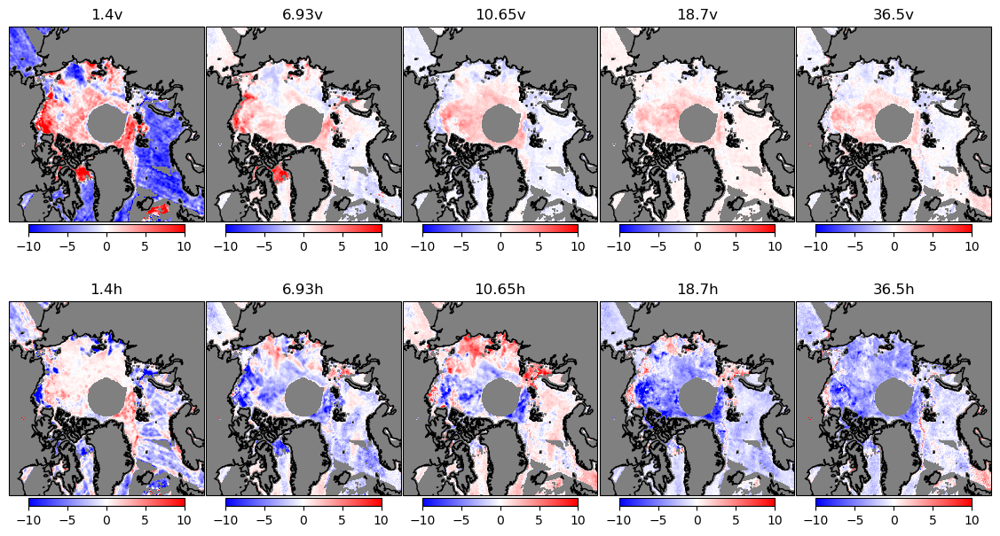

In [13]:
fig=plot_oem_res(res,D,false,true)

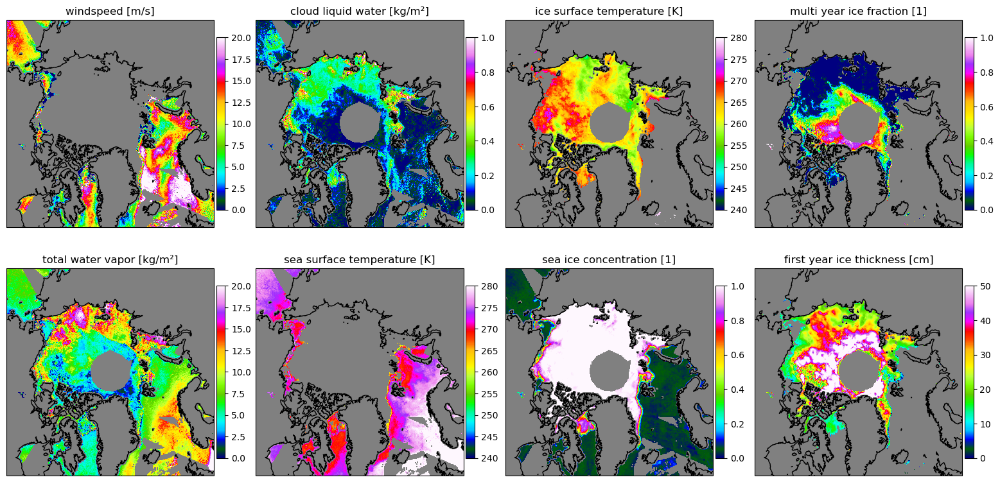

In [49]:
plot_oem_out(dat,D)

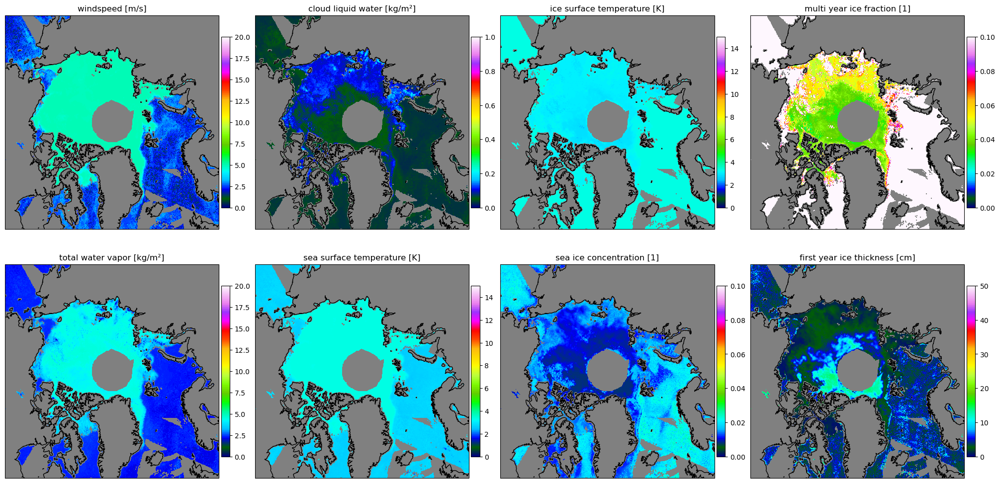

In [50]:
plot_oem_err(err,D)